# Análise de dados
# Furto de Automoveis no estado de São Paulo.


 O objetivo dessa análise é encontrar um padrão sobre os furtos de veículos no estado de São Paulo.
 
 
 ## Dados obtidos: Secretaria de segurança do estado de São Paulo
 
 <img src="img/What-Else-Mag-Lifestyle-Lugares-Vistas-Mais-Bonitas-De-Sao-Paulo-Cover.jpg"  >




Link: http://www.ssp.sp.gov.br/transparenciassp/

dados referentes janeiro de 2009 a dezembro 2019.

In [1]:
import pandas as pd
import numpy as np
import scipy
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import folium
%matplotlib inline



import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 999)

In [2]:
%time data = pd.read_csv('C:/Users/skite/OneDrive/Documentos/GitHub/Projeto_de_TimeSeries/Furtos_em_10_anos/Furtos_10_anos_2.csv', sep = ',', encoding  = 'UTF-8')

Wall time: 2.92 s


In [3]:
data

,ANO_BO,DATAOCORRENCIA,HORAOCORRENCIA,PERIDOOCORRENCIA,DATACOMUNICACAO,LOGRADOURO,NUMERO,BAIRRO,CIDADE,LATITUDE,LONGITUDE,DESCRICAOLOCAL,CIDADE_VEICULO,DESCR_COR_VEICULO,DESCR_MARCA_VEICULO,ANO_FABRICACAO,DESCR_TIPO_VEICULO,PLACA_VEICULO,DELEGACIA_NOME
0,2008,31/12/2008,NaN,A NOITE,31/12/2008,RUA FRANCISCO RANIERE,324.0,LAUZANE,SÃO PAULO,NaN,NaN,Via pública,NaN,NaN,NaN,NaN,NaN,NaN,DELEGACIA ELETRONICA
1,2009,31/12/2008,NaN,A NOITE,01/01/2009,RUA LAGOA TAI GRANDE,110.0,ITAQUERA,SÃO PAULO,NaN,NaN,Via pública,NaN,NaN,NaN,NaN,NaN,NaN,DELEGACIA ELETRONICA
2,2008,30/12/2008,NaN,A TARDE,31/12/2008,RUA GERALDO SALINE ROMEO,96.0,JARDIM ORIENTAL,SÃO PAULO,NaN,NaN,Via pública,NaN,NaN,NaN,NaN,NaN,NaN,DELEGACIA ELETRONICA
3,2009,31/12/2008,17:30,A TARDE,01/01/2009,R TIE,206.0,MOOCA,S.PAULO,NaN,NaN,Via pública,SAO PAULO,Cinza,VW/VOYAGE,1982.0,AUTOMOVEL,CKG1371,57º D.P. PARQUE DA MOOCA
4,2009,31/12/2008,17:30,A TARDE,01/01/2009,R TIE,206.0,MOOCA,S.PAULO,NaN,NaN,Via pública,SAO PAULO,Cinza,VW/VOYAGE,1982.0,AUTOMOVEL,CKG1371,57º D.P. PARQUE DA MOOCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
618246,2019,31/12/2019,NaN,DE MADRUGADA,31/12/2019,NaN,0.0,JABAQUARA,S.PAULO,NaN,NaN,Residência,S.PAULO,Branco,FIAT/ARGO TREKKING 1.3,2019.0,AUTOMOVEL,GDV2306,26º D.P. SACOMA
618247,2019,31/12/2019,NaN,DE MADRUGADA,31/12/2019,NaN,0.0,JABAQUARA,S.PAULO,NaN,NaN,Residência,NaN,NaN,NaN,0.0,NaN,NaN,26º D.P. SACOMA
618248,2019,31/12/2019,NaN,DE MADRUGADA,31/12/2019,NaN,0.0,JABAQUARA,S.PAULO,NaN,NaN,Residência,S.PAULO,Branco,FIAT/ARGO TREKKING 1.3,2019.0,AUTOMOVEL,GDV2306,26º D.P. SACOMA
618249,2019,14/12/2019,03:38,DE MADRUGADA,31/12/2019,RUA ASCENSO DE QUADROS,18.0,GUAIANASES,S.PAULO,"-23,5376459","-46,4080202",Via Pública,SÃO JOSÉ DO RIO PARD,Branco,VW/GOL CL,1991.0,AUTOMOVEL,BGH4245,DELEGACIA ELETRONICA


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 618251 entries, 0 to 618250
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ANO_BO               618251 non-null  int64  
 1   DATAOCORRENCIA       618251 non-null  object 
 2   HORAOCORRENCIA       344353 non-null  object 
 3   PERIDOOCORRENCIA     618251 non-null  object 
 4   DATACOMUNICACAO      618251 non-null  object 
 5   LOGRADOURO           574849 non-null  object 
 6   NUMERO               618195 non-null  float64
 7   BAIRRO               564634 non-null  object 
 8   CIDADE               616318 non-null  object 
 9   LATITUDE             452346 non-null  object 
 10  LONGITUDE            452345 non-null  object 
 11  DESCRICAOLOCAL       618251 non-null  object 
 12  CIDADE_VEICULO       452938 non-null  object 
 13  DESCR_COR_VEICULO    454107 non-null  object 
 14  DESCR_MARCA_VEICULO  447655 non-null  object 
 15  ANO_FABRICACAO   

**Logo aqui já podemos ver que há bastante dados que não foram preenchidos**

In [5]:
data['COUNT'] = 1

## Ajuste dos dados

**Vamos analisar as placas dos veiculos, pois temos muitas placas faltantes:**

In [6]:
data.PLACA_VEICULO.value_counts()

0          109
XXX0000     49
XXX1111     44
XXXXXXX     19
FOS5126     19
          ... 
HHJ6752      1
FKN9440      1
BMI5997      1
BNY1746      1
DYR7937      1
Name: PLACA_VEICULO, Length: 395893, dtype: int64

**Note que temos placas com valores como zero, descrição que não  corresponde ao padrão estabelecido pelo Departamentos Estaduais de Trânsito (DETRANs)**

**Temos também valores ducplicados, vamos analisar essas placas duplicadas**

In [7]:
data[data['PLACA_VEICULO'] == 'FOS5126']

,ANO_BO,DATAOCORRENCIA,HORAOCORRENCIA,PERIDOOCORRENCIA,DATACOMUNICACAO,LOGRADOURO,NUMERO,BAIRRO,CIDADE,LATITUDE,LONGITUDE,DESCRICAOLOCAL,CIDADE_VEICULO,DESCR_COR_VEICULO,DESCR_MARCA_VEICULO,ANO_FABRICACAO,DESCR_TIPO_VEICULO,PLACA_VEICULO,DELEGACIA_NOME,COUNT
607135,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607137,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607139,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607141,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607143,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607145,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607154,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607156,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607158,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1
607160,2019,03/10/2019,03:25,DE MADRUGADA,03/10/2019,RUA ARTISTAS DE HELIOPOLIS,62.0,SACOMA,S.PAULO,"-23,61398254","-46,59376652",Via pública,SAO BERNARDO DO CAM,Cinza,FIAT/TORO FREEDOM AT,2018.0,CAMINHONETE,FOS5126,95º D.P. HELIÓPOLIS,1


**Conclusão: Analisando essas placas duplicadas e fora do padrão conforme estabelecido pelo DETRAN cheguei a conclusão  que de alguma forma o sistema de resgistro de Boletim de ocorrência tem alguma falha, pois temos alguns casos que o mesmo furto tem varios registro para o mesmo dia e horario, temos também modelos de veículos diferentes com a mesma placa**

In [8]:
data['PLACA_VEICULO'].isnull().sum()

164821

**Temos uma grande quantidade de valores nulos em nosso banco de dados**

* **Decisão vou optar por dropar todos os valores nulos e duplicados, pois não tem muito a se fazer com essa variável, a placa é a identidade do veículo e qualquer dado que eu inserir nessa variável seria uma violação.**

In [9]:
data = data.drop_duplicates('PLACA_VEICULO')
data.PLACA_VEICULO.value_counts()

JDX4523    1
FZR1042    1
CGB9512    1
HIF3008    1
CEM2277    1
          ..
BIN0687    1
EYJ7319    1
EFA7267    1
EMK7916    1
DYR7937    1
Name: PLACA_VEICULO, Length: 395893, dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395894 entries, 0 to 618250
Data columns (total 20 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ANO_BO               395894 non-null  int64  
 1   DATAOCORRENCIA       395894 non-null  object 
 2   HORAOCORRENCIA       250597 non-null  object 
 3   PERIDOOCORRENCIA     395894 non-null  object 
 4   DATACOMUNICACAO      395894 non-null  object 
 5   LOGRADOURO           368049 non-null  object 
 6   NUMERO               395889 non-null  float64
 7   BAIRRO               356106 non-null  object 
 8   CIDADE               395889 non-null  object 
 9   LATITUDE             303387 non-null  object 
 10  LONGITUDE            303386 non-null  object 
 11  DESCRICAOLOCAL       395894 non-null  object 
 12  CIDADE_VEICULO       395108 non-null  object 
 13  DESCR_COR_VEICULO    395893 non-null  object 
 14  DESCR_MARCA_VEICULO  389888 non-null  object 
 15  ANO_FABRICACAO   

**Mesmo aplicado um drop dos valores duplicados e nulos da variável PLACA_VEICULO ainda temos algumas variáveis com valores nulos como HORAOCORRENCIA, LATITUDE, LONGITUDE**

**No decorrer do projeto iremos entender por que essa variáveis estão assim**

## Análise Exploratória dos Dados (EDA)

**Vamos iniciar nossa análise pelos anos das ocorrências em nosso dataset temos os registros de 2009 a 2019**

**Qual ano tivemos mais ocorrências de furto ?**

In [11]:
data['DATAOCORRENCIA'].value_counts()

25/01/2015    248
13/08/2014    236
17/09/2014    220
22/05/2014    219
21/10/2014    217
             ... 
01/03/2006      1
10/12/2004      1
19/03/2007      1
01/01/1978      1
11/10/2001      1
Name: DATAOCORRENCIA, Length: 4751, dtype: int64

In [12]:
data['ANO_OCORRENCIA'] = data['DATAOCORRENCIA'].str[-4:]

In [13]:
ano_ocorrencia = data.groupby('ANO_OCORRENCIA',as_index=False).agg({'COUNT':'sum'})

In [14]:
ano_ocorrencia_2 = ano_ocorrencia.sort_values(by='COUNT', ascending=False)
ano_ocorrencia_2

,ANO_OCORRENCIA,COUNT
64,2014,51134
65,2015,46184
66,2016,43500
67,2017,39420
69,2019,36756
...,...,...
1,0210,1
20,1967,1
22,1970,1
38,1988,1


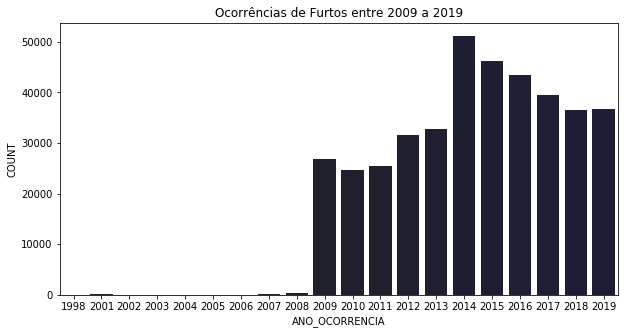

In [15]:
plt.figure(figsize=(10,5))
plt.title("Ocorrências de Furtos entre 2009 a 2019")
sns.barplot(x="ANO_OCORRENCIA", y="COUNT", data=ano_ocorrencia_2.head(20), palette=sns.dark_palette("navy",n_colors=len(ano_ocorrencia_2)));

**Note que tivemos furtos antes de 2008 mais só foram registrados entre 2009 à 2019**

**Vamos confirmar essa hipótese  através da variável DATACOMUNICACAO**

In [16]:
data['DATACOMUNICACAO'].value_counts()

17/09/2014    230
17/03/2015    218
22/05/2014    216
22/10/2014    215
13/08/2014    213
             ... 
25/12/2009     15
01/01/2009     12
30/03/2009      8
29/03/2009      4
31/12/2008      1
Name: DATACOMUNICACAO, Length: 4018, dtype: int64

In [17]:
data['ANO_COMUNICACAO'] = data['DATACOMUNICACAO'].str[-4:]

In [18]:
ano_comunicacao = data.groupby('ANO_COMUNICACAO',as_index=False).agg({'COUNT':'sum'})

In [19]:
ano_comunicacao_2 = ano_comunicacao.sort_values(by='COUNT', ascending=False)
ano_comunicacao_2

,ANO_COMUNICACAO,COUNT
6,2014,51188
7,2015,46289
8,2016,43667
9,2017,39583
11,2019,37287
10,2018,36522
5,2013,32876
4,2012,31425
1,2009,27034
3,2011,25435


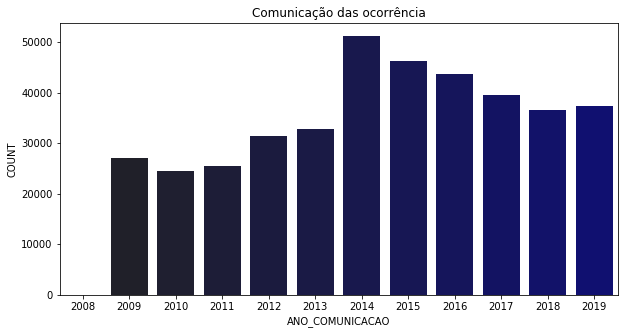

In [20]:
plt.figure(figsize=(10,5))
plt.title("Comunicação das ocorrência")
sns.barplot(x="ANO_COMUNICACAO", y="COUNT", data=ano_comunicacao_2.head(20), palette=sns.dark_palette("navy",n_colors=len(ano_comunicacao)));

**Por algum motivo o sistema de resgistro de boletim de ocorrência da secretaria de segurança do estado de são paulo resgistro um comunicado de 2008, sendo que esse dataset somente é do período de 2009 a 2019 (dez anos de registros)**

**Mesmo com esse único registro de 2008, não quebra nossa hipótese de que alguns furtos aconteceram antes de 2008 e foram resgitrados entre 2009 a 2019**

**O motivo pelo qual esse espaçamento entre a data da ocorrência do furto e a data da comunição não é claro.**

**Por esse motivo vamos aplicar um filtro com a data da ocorrência no intervalo dos dez anos (2009/2019)**

In [21]:
converte_inteiro = lambda s: int(s)
data['ANO_OCORRENCIA'] = data['ANO_OCORRENCIA'].apply(converte_inteiro)

In [22]:
data_ajustado = data.loc[data['ANO_OCORRENCIA'] > 2008]

In [23]:
data_ajustado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394882 entries, 8 to 618250
Data columns (total 22 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ANO_BO               394882 non-null  int64  
 1   DATAOCORRENCIA       394882 non-null  object 
 2   HORAOCORRENCIA       249997 non-null  object 
 3   PERIDOOCORRENCIA     394882 non-null  object 
 4   DATACOMUNICACAO      394882 non-null  object 
 5   LOGRADOURO           367187 non-null  object 
 6   NUMERO               394877 non-null  float64
 7   BAIRRO               355274 non-null  object 
 8   CIDADE               394877 non-null  object 
 9   LATITUDE             302960 non-null  object 
 10  LONGITUDE            302959 non-null  object 
 11  DESCRICAOLOCAL       394882 non-null  object 
 12  CIDADE_VEICULO       394100 non-null  object 
 13  DESCR_COR_VEICULO    394882 non-null  object 
 14  DESCR_MARCA_VEICULO  388889 non-null  object 
 15  ANO_FABRICACAO   

In [24]:
ano_ocorrencia = data_ajustado.groupby('ANO_OCORRENCIA',as_index=False).agg({'COUNT':'sum'})

In [25]:
ano_ocorrencia_2 = ano_ocorrencia.sort_values(by='COUNT', ascending=False)
ano_ocorrencia_2

,ANO_OCORRENCIA,COUNT
5,2014,51134
6,2015,46184
7,2016,43500
8,2017,39420
10,2019,36756
9,2018,36525
4,2013,32820
3,2012,31525
0,2009,26907
2,2011,25400


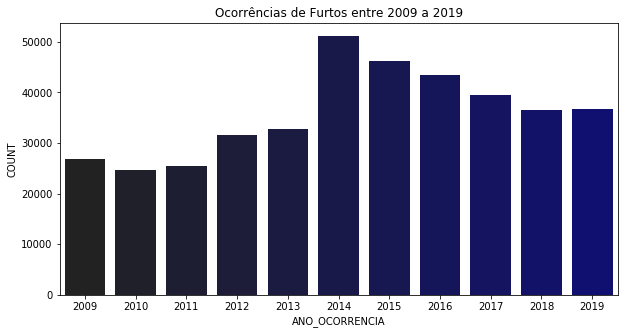

In [26]:
plt.figure(figsize=(10,5))
plt.title("Ocorrências de Furtos entre 2009 a 2019")
sns.barplot(x="ANO_OCORRENCIA", y="COUNT", data=ano_ocorrencia_2.head(20), palette=sns.dark_palette("navy",n_colors=len(ano_ocorrencia_2)));

**Temos agora somente ocorrências de furtos no intervalo de 10 anos, note que entre 2010 a 2014 tivemos uma crescente do número de furtos sendo 2014 o anos com mais registros de ocorrências e entre 2014 a 2018 tivemos uma queda, entre 2018 e 2019 o número de ocorrências se manteve estável**

### Verificando os tipos de veículos mais furtados

In [27]:
tipo_veiculo = data_ajustado.groupby('DESCR_TIPO_VEICULO',as_index=False).agg({'COUNT':'sum'})

In [28]:
tipo_veiculo_2 = tipo_veiculo.sort_values(by='COUNT', ascending=False)
tipo_veiculo_2

,DESCR_TIPO_VEICULO,COUNT
0,AUTOMOVEL,286591
11,MOTOCICLO,53993
2,CAMINHONETE,22389
5,CAMIONETA,15333
12,MOTONETA,5124
3,CAMINHÃO,3803
23,UTILITÁRIO,1394
10,MICRO-ONIBUS,787
14,Não Informado,621
4,CAMINHÃO TRATOR,285


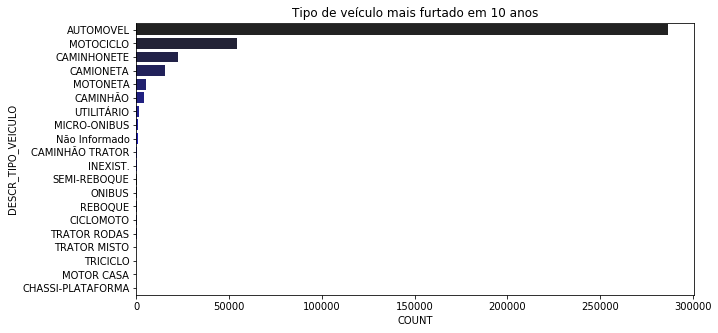

In [29]:
plt.figure(figsize=(10,5))
plt.title("Tipo de veículo mais furtado em 10 anos")
sns.barplot(x="COUNT", y="DESCR_TIPO_VEICULO", data=tipo_veiculo_2.head(20),  palette=sns.dark_palette ("blue", n_colors=len(ano_ocorrencia_2)));

**Note que a grande maioria dos furtos registrados nos últimos 10 anos foram de Automóveis**

## EDA dos Automóveis furtados

**Para que nossa análise não fique muito longa e cansativa, vamos restringi-la somente para automóveis**

In [30]:
automovel = data_ajustado.loc[data_ajustado['DESCR_TIPO_VEICULO'] == 'AUTOMOVEL']

In [31]:
automovel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 286591 entries, 8 to 618250
Data columns (total 22 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ANO_BO               286591 non-null  int64  
 1   DATAOCORRENCIA       286591 non-null  object 
 2   HORAOCORRENCIA       181559 non-null  object 
 3   PERIDOOCORRENCIA     286591 non-null  object 
 4   DATACOMUNICACAO      286591 non-null  object 
 5   LOGRADOURO           268557 non-null  object 
 6   NUMERO               286588 non-null  float64
 7   BAIRRO               258103 non-null  object 
 8   CIDADE               286588 non-null  object 
 9   LATITUDE             219258 non-null  object 
 10  LONGITUDE            219257 non-null  object 
 11  DESCRICAOLOCAL       286591 non-null  object 
 12  CIDADE_VEICULO       286036 non-null  object 
 13  DESCR_COR_VEICULO    286591 non-null  object 
 14  DESCR_MARCA_VEICULO  285012 non-null  object 
 15  ANO_FABRICACAO   

**Ok, agora em nosso dataset temos somente automóveis**

### Sabendo disso podemos responder algumas perguntas:
- **Quais os automóvel mais furtados dos últimos 10 anos ?**
- **Qual a cor do automóvel mais furtado ?**
- **Qual o período do dia que é mais propensa a furto ?**
- **Qual horário é mais propensa a ocorrer um furto ?**
- **Qual rua/avenida/estrada com mais ocorrência de furto ?**
- **Qual bairro de são paulo com mais ocorrência de furto ?**

### Modelo dos Automóveis mais furtados.

In [32]:
graf_automovel = automovel.groupby('DESCR_MARCA_VEICULO',as_index=False).agg({'COUNT':'sum'})

In [33]:
graf_automovel_2 = graf_automovel.sort_values(by='COUNT', ascending=False)
graf_automovel_2

,DESCR_MARCA_VEICULO,COUNT
2879,VW/GOL 1.0,7358
336,FIAT/PALIO FIRE ECONOMY,5713
47,CHEVROLET/CELTA 1.0L LT,5531
864,GM/CORSA WIND,5178
337,FIAT/PALIO FIRE FLEX,4740
...,...,...
2696,RENAULT/OROCH 16 EXP42,1
2697,RENAULT/OROCH 20 DYN42,1
1708,I/MMC AIRTREK,1
1707,I/MITSUBISHI LANCER MR,1


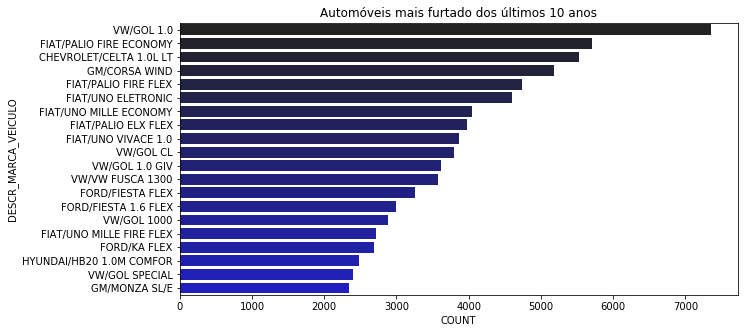

In [34]:
plt.figure(figsize=(10,5))
plt.title("Automóveis mais furtado dos últimos 10 anos")
sns.barplot(x="COUNT", y="DESCR_MARCA_VEICULO", data=graf_automovel_2.head(20),  palette=sns.dark_palette ("blue", n_colors=len(tipo_veiculo_2)));

**Temos aqui os 20 automóveis mais furtados, note que o VW Gol 1.0 é o automóvel mais furtado dos últimos 10 anos.**

### Ano dos Automóveis mais furtados.

In [35]:
automovel['ANO_FABRICACAO'].isnull().sum()

648

**Temos 648 valores nulos na variável ANO_FABRICACAO e precisamos passar essa variável para inteiro.**

**Optei por substituir os valores NaN pela mediana, pois os NaN's representam aproximadamente 0,23% da colunas um valor muito baixo**

In [36]:
automovel['ANO_FABRICACAO']  = automovel['ANO_FABRICACAO'] .fillna((automovel['ANO_FABRICACAO'] .median()))

In [37]:
automovel['ANO_FABRICACAO'] = automovel.ANO_FABRICACAO.astype('int')

In [38]:
graf_automovel_ano = automovel.groupby('ANO_FABRICACAO',as_index=False).agg({'COUNT':'sum'})

In [39]:
graf_automovel_ano_2 = graf_automovel_ano.sort_values(by='COUNT', ascending=False)
graf_automovel_ano_2

,ANO_FABRICACAO,COUNT
92,2011,21028
93,2012,20762
91,2010,20692
90,2009,19039
94,2013,18518
...,...,...
22,1191,1
20,1092,1
18,1013,1
17,1011,1


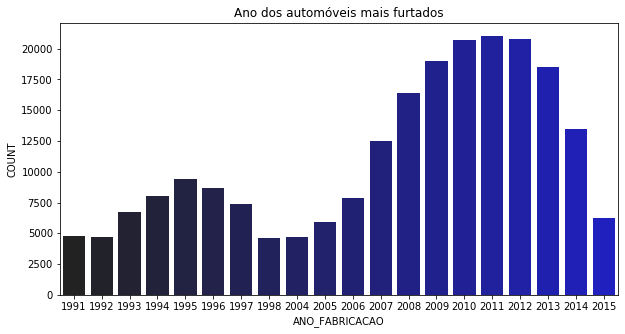

In [40]:
plt.figure(figsize=(10,5))
plt.title("Ano dos automóveis mais furtados")
sns.barplot(x="ANO_FABRICACAO", y="COUNT", data=graf_automovel_ano_2.head(20),  palette=sns.dark_palette ("blue", n_colors=len(tipo_veiculo_2)));

**Aqui estão os anos de fabricação dos automóveis  mais furtados, note que entre 2007 a 2014 são os anos com mais ocrrência sendo em 2011 o pico.**

### Cor dos Automóveis mais furtados.

In [41]:
graf_automovel_cor = automovel.groupby('DESCR_COR_VEICULO',as_index=False).agg({'COUNT':'sum'})

In [42]:
graf_automovel_cor_2 = graf_automovel_cor.sort_values(by='COUNT', ascending=False)
graf_automovel_cor_2

,DESCR_COR_VEICULO,COUNT
10,Prata,74085
11,Preta,55831
4,Cinza,45704
3,Branco,33487
15,Vermelho,33358
1,Azul,18737
14,Verde,14246
2,Bege,6386
9,Marrom,2070
0,Amarelo,1318


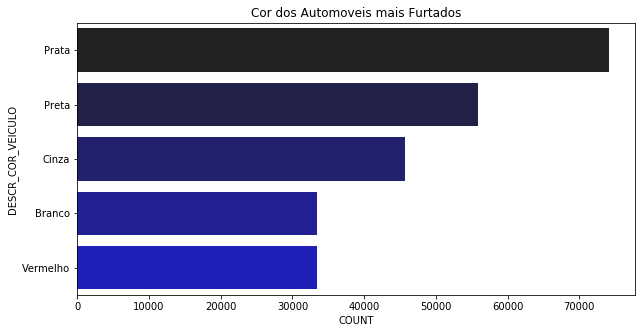

In [43]:
plt.figure(figsize=(10,5))
plt.title("Cor dos Automoveis mais Furtados")
sns.barplot(x="COUNT", y="DESCR_COR_VEICULO", data=graf_automovel_cor_2.head(5),  palette=sns.dark_palette ("blue"));

**Temos aqui as cores com mais ocorrência de furto**

### Período em que Automóveis são mais furtados.

In [44]:
graf_automovel_periodo = automovel.groupby('PERIDOOCORRENCIA',as_index=False).agg({'COUNT':'sum'})

In [45]:
graf_automovel_periodo_2 = graf_automovel_periodo.sort_values(by='COUNT', ascending=False)
graf_automovel_periodo_2

,PERIDOOCORRENCIA,COUNT
4,PELA MANHÃ,85230
0,A NOITE,72694
1,A TARDE,72333
2,DE MADRUGADA,31990
3,EM HORA INCERTA,24344


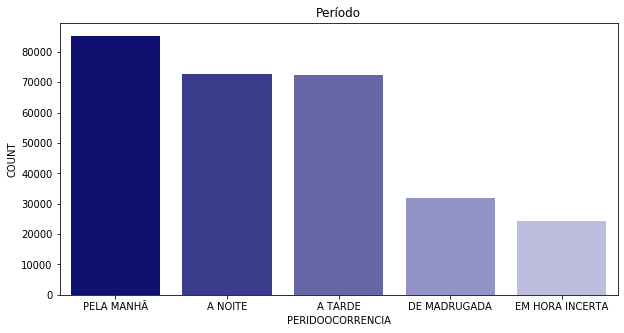

In [46]:
plt.figure(figsize=(10,5))
plt.title("Período")
sns.barplot(x="PERIDOOCORRENCIA", y="COUNT", data=graf_automovel_periodo_2.head(5),  palette=sns.light_palette("navy", reverse=True));

**Note que o período mais frequênte de furto é pela manhã, durante a madrugada temos a menor freuqência**

**Temos também no período horário incerto por que isso ocorreu ? Como se tratar de um furto, ou seja, a subtração, para si ou para outrem, coisa alheia móvel segundo o código penal Art. 155. algumas vitimas acabam não sabendo ao certo em que período ou horário seu automóvel foi furtado, pois no momento do ocorrido estão trabalhando ou em casa ou até mesmo em momentos de lazer longe do automóvel**

### Horário mais frequente de furto de Automóveis.

In [47]:
automovel['HORA_OCORRENCIA'] = automovel['HORAOCORRENCIA'].str[:2]

In [48]:
graf_automovel_horario = automovel.groupby('HORA_OCORRENCIA',as_index=False).agg({'COUNT':'sum'})

In [49]:
graf_automovel_horario_2 = graf_automovel_horario.sort_values(by='COUNT', ascending=False)
graf_automovel_horario_2

,HORA_OCORRENCIA,COUNT
12,12,13152
11,11,13016
10,10,12400
13,13,10879
14,14,9879
9,09,9716
20,20,9665
21,21,9441
19,19,9007
15,15,8825


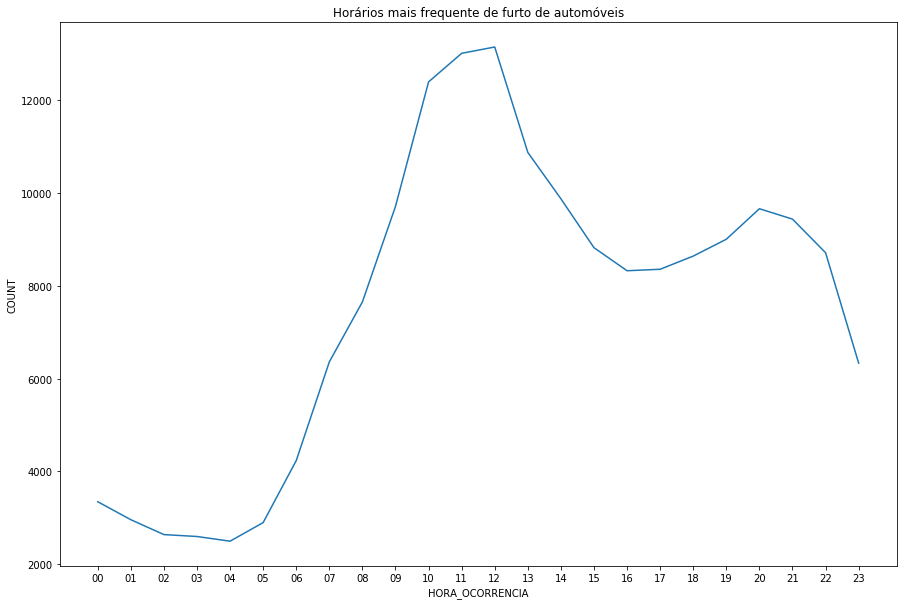

In [50]:
plt.figure(figsize=(15,10))
plt.title("Horários mais frequente de furto de automóveis")
ax = sns.lineplot(x='HORA_OCORRENCIA', y='COUNT', data = graf_automovel_horario_2.head(24), palette = sns.color_palette("PuBuGn_d")) #marker='o'

**Temos aqui os horários mais frequente de furto, note que a partir das 04hrs temos uma crescente constate no número de furto até as 12hrs onde atinge o pico como o horário com mais ocorrências**

### Dia da semana com mais furtos de Automóveis.

In [51]:
automovel.DATAOCORRENCIA = pd.to_datetime(automovel.DATAOCORRENCIA)

In [52]:
automovel['DIA_SEMANA'] = automovel.DATAOCORRENCIA.dt.day_name()

**A função dt.day_name transforma datas em dias da semana, só que essa transforamção passa tudo para inglês.**

**Vamos criar uma função para traduzir isso:**

In [53]:
automovel['DIA_SEMANA'].value_counts()

Wednesday    45915
Thursday     44731
Tuesday      44497
Sunday       39484
Friday       39002
Monday       37068
Saturday     35894
Name: DIA_SEMANA, dtype: int64

In [54]:
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Wednesday','Quarta-feira'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Thursday','Quinta-feira'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Tuesday','Terça-feira'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Sunday','Domingo'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Friday','Sexta-feira'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Monday','Segunda-feira'))
automovel['DIA_SEMANA'] = automovel['DIA_SEMANA'].apply(lambda x: x.replace('Saturday','Sábado'))

In [55]:
ocorrencia_dias = automovel.groupby('DIA_SEMANA',as_index=False).agg({'COUNT':'sum'})

In [56]:
ocorrencia_dias_2 = ocorrencia_dias.sort_values(by='COUNT', ascending=False)
ocorrencia_dias_2

,DIA_SEMANA,COUNT
1,Quarta-feira,45915
2,Quinta-feira,44731
6,Terça-feira,44497
0,Domingo,39484
4,Sexta-feira,39002
3,Segunda-feira,37068
5,Sábado,35894


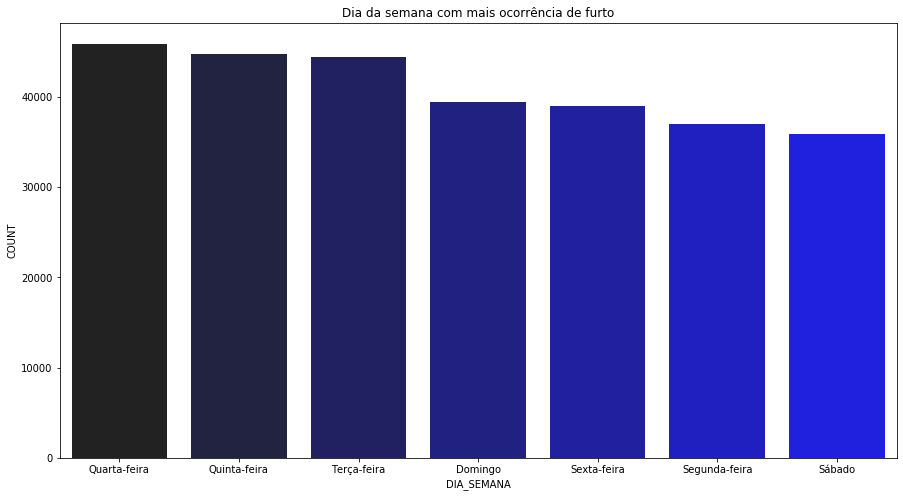

In [57]:
plt.figure(figsize=(15,8))
plt.title("Dia da semana com mais ocorrência de furto")
sns.barplot(x="DIA_SEMANA", y="COUNT", data=ocorrencia_dias_2.head(12).sort_values(by='COUNT', ascending=False),  palette=sns.dark_palette ("blue", n_colors=len(ocorrencia_dias_2)));

**Note que Quarta, Quinta e Terça são os dias com mais ocorrência de furto em contrapartida Sábado foi o dia que menos registro ocorrências de furtos**

### Descrição do local onde os furtos ocorrem.

In [58]:
automovel['DESCRICAOLOCAL'] = automovel['DESCRICAOLOCAL'].apply(lambda x: x.replace('P','p'))
automovel['DESCRICAOLOCAL'].value_counts()

Via pública                        212633
Outros                              58249
Comércio e serviços                  6601
Residência                           5705
Lazer e recreação                     525
Condominio Residencial                415
Centro Comerc./Empresarial            404
Estacionamento público                403
Shopping Center                       159
Estabelecimento de ensino             148
Restaurante e afins                   145
Saúde                                 132
Area não ocupada                      130
Estacionamento com vigilância         126
Garagem ou abrigo de residência       124
Repartição pública                    119
Templo e afins                         99
Estacionamento particular              86
Condominio Comercial                   66
Escritório                             43
Hospedagem                             42
Garagem coletiva de prédio             40
Terminal/Estação                       38
Estabelecimento bancário          

**Temos registros de furto em diversas localidades desde Restaurante e afins até a Local clandestino/ilegal, mas a grande maioria dos furtos ocorre em via pública, temos também registro em diversos tipos de estacionamentos e garagens**

### Podemos ultilizar o folium para visualizar em um mapa as regiões de São Paulo com essas ocorrências. 

In [62]:
mapa = folium.Map(location=[-23.5489,-46.6388], zoom_start = 10, tiles='OpenStreetMap')
mapa.add_child(folium.LatLngPopup())

**Para fazer o plot do mapa será necessário fazer alguns ajustes nas variáveis LATITUDE, LONGITUDE**

**Teremos que dropar os valores NaN**

In [63]:
localizacao = data_ajustado.loc[data_ajustado['DESCR_TIPO_VEICULO'] == 'AUTOMOVEL']

In [64]:
localizacao.dropna(inplace=True)

**Agora será necessário substituir a vírgula por ponto**

In [65]:
localizacao['LONGITUDE'] = localizacao.LONGITUDE.astype('str')
localizacao['LATITUDE'] = localizacao.LATITUDE.astype('str')

In [66]:
localizacao['LONGITUDE'] = localizacao['LONGITUDE'].apply(lambda x: x.replace(',','.'))
localizacao['LATITUDE'] = localizacao['LATITUDE'].apply(lambda x: x.replace(',','.'))

In [67]:
import pandas as pd
from folium import plugins
from folium.plugins import FastMarkerCluster

localizacao['COORD'] = localizacao[['LATITUDE','LONGITUDE']].apply(tuple, axis=1)

coordenadas=[]
for LATITUDE, LONGITUDE in zip(localizacao['LATITUDE'], localizacao['LONGITUDE']):
  coordenadas.append([LATITUDE, LONGITUDE])

mapa.add_child(FastMarkerCluster(localizacao['COORD']))

mapa

**A função FastMarkerCluster do folium nos ajuda a visualizar as ocorrências em grupos, conforme acrescentamos ou retiramos zoom o número e a área de onde os furtos aumenta ou diminui**

**Um outro recurso do Folium que nos ajudar a vizualizar a distribuição dessas ocorrências pelo estado de São Paulo é o HeatMap(Mapa de calor) com ele podemos observar as regiões onde tivemos mais casos de furto nos últimos dez anos.**

In [68]:
mapa_calor = folium.Map(location=[-23.5489,-46.6388], zoom_start = 12, tiles='Stamen Toner')
mapa_calor.add_child(folium.LatLngPopup())

In [69]:
import pandas as pd
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap


localizacao['COORD'] = localizacao[['LATITUDE','LONGITUDE']].apply(tuple, axis=1)

coordenadas=[]
for LATITUDE, LONGITUDE in zip(localizacao['LATITUDE'], localizacao['LONGITUDE']):
  coordenadas.append([LATITUDE, LONGITUDE])

mapa_calor.add_child(HeatMap(localizacao['COORD'], radius=10))

mapa_calor

**Note que conforme percorremos o mapa as "manchas" em algumas regiões se intensificam para coloração vermelha isso indica que nessa área as ocorrências de furto são maior que nas demais**

### Agora veremos as ruas com mais ocorrências de furtos de automóvel.

**Será necessário fazer uma correção, pois alguns registro usam as palavaras Avenida e rua e outras usam abreviações como av e r**

In [76]:
automovel = automovel.dropna(thresh=22)

In [77]:
automovel['LOGRADOURO'] = automovel.LOGRADOURO.astype('str')

In [78]:
automovel['LOGRADOURO'] = automovel['LOGRADOURO'].apply(lambda x: x.replace('AV ','AVENIDA'))
automovel['LOGRADOURO'] = automovel['LOGRADOURO'].apply(lambda x: x.replace('R ','RUA'))

In [79]:
graf_automovel_rua = automovel.groupby('LOGRADOURO',as_index=False).agg({'COUNT':'sum'})

In [80]:
graf_automovel_rua_2 = graf_automovel_rua.sort_values(by='COUNT', ascending=False)
graf_automovel_rua_2

,LOGRADOURO,COUNT
1892,AVENIDA SAPOPEMBA,435
4279,PARQUE DOMINGOS LUIS,379
2272,AVENIDADAS NACOES UNIDAS,358
6734,RUA ALVINOPOLIS,298
2992,AVENIDASAPOPEMBA,295
...,...,...
23016,RUA MARIETA,1
23015,RUA MARIE NADERUACALFAT,1
23012,RUA MARIATH,1
23011,RUA MARIANO SPINOSA,1


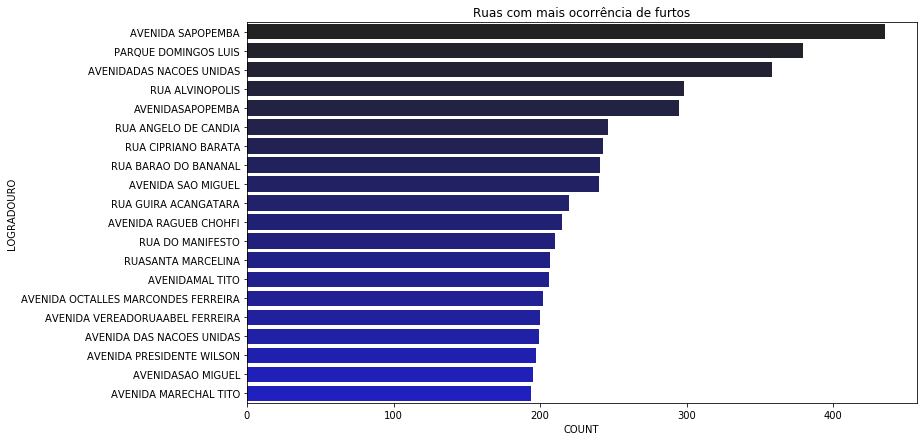

In [81]:
plt.figure(figsize=(12,7))
plt.title("Ruas com mais ocorrência de furtos")
sns.barplot(x="COUNT", y="LOGRADOURO", data=graf_automovel_rua_2.head(20),  palette=sns.dark_palette ("blue", n_colors=len(tipo_veiculo_2)));

**A Avenida sapopemba registro mais ocorrências de furto no últimos dez anos**

### Agora vamos responder qual região da capital paulistana tem mais ocorrência de furto.

In [82]:
automovel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 237713 entries, 10 to 618250
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   ANO_BO               237713 non-null  int64         
 1   DATAOCORRENCIA       237713 non-null  datetime64[ns]
 2   HORAOCORRENCIA       162274 non-null  object        
 3   PERIDOOCORRENCIA     237713 non-null  object        
 4   DATACOMUNICACAO      237713 non-null  object        
 5   LOGRADOURO           237713 non-null  object        
 6   NUMERO               237713 non-null  float64       
 7   BAIRRO               228321 non-null  object        
 8   CIDADE               237713 non-null  object        
 9   LATITUDE             209900 non-null  object        
 10  LONGITUDE            209900 non-null  object        
 11  DESCRICAOLOCAL       237713 non-null  object        
 12  CIDADE_VEICULO       237625 non-null  object        
 13  DESCR_COR_VEI

In [83]:
automovel['CIDADE'].value_counts()

S.PAULO                   231675
SAO PAULO                   4365
SÃO PAULO                    946
Sao Paulo                    178
GUARULHOS                    145
OSASCO                       136
ITAQUAQUECETUBA               40
CARAPICUÍBA                   34
POÁ                           27
MOGI DAS CRUZES               25
TABOAO DA SERRA               21
SUZANO                        19
BARUERI                       13
DIADEMA                       10
ITAPECERICA DA SERRA           9
FERRAZ DE VASCONCELOS          6
S.BERNARDO DO CAMPO            6
ITAPEVI                        5
S.ANDRE                        4
COTIA                          4
S.CAETANO DO SUL               4
BIRITIBA-MIRIM                 3
JUNDIAI                        3
S.JOSE DOS CAMPOS              2
MAUA                           2
ARUJA                          2
ADAMANTINA                     2
GUARAREMA                      2
PIRAPORA DO BOM JESUS          2
JOSE BONIFACIO                 1
ARUJÁ     

**Iremos aplicar um filtro somente para a capital paulistana, mas primeiro será necessário fazer alguns ajuste**

In [84]:
automovel['CIDADE'] = automovel['CIDADE'].apply(lambda x: x.replace('S.','SAO '))
automovel['CIDADE'] = automovel['CIDADE'].apply(lambda x: x.replace('SÃO','SAO'))
automovel['CIDADE'] = automovel['CIDADE'].apply(lambda x: x.replace('sao paulo','SAO PAULO'))

**Agora aplicaremos um filtro somente para a capital**

In [85]:
capital = automovel.loc[automovel['CIDADE'] == 'SAO PAULO']

In [86]:
capital['CIDADE'].value_counts()

SAO PAULO    236986
Name: CIDADE, dtype: int64

**Ok, Agora iremos separar os bairros por região.**

In [87]:
capital['BAIRRO'].value_counts().head(100)

IPIRANGA          5952
TATUAPE           4701
PENHA             4650
LAPA              4596
VILA PRUDENTE     4567
                  ... 
JURUBATUBA         459
VILA EMA           434
RAPOSO TAVARES     431
VILA ANDRADE       409
SÃO MATEUS         356
Name: BAIRRO, Length: 100, dtype: int64

In [89]:
capital['BAIRRO'] = capital.BAIRRO.astype('str')

In [90]:
capital['BAIRRO'] = capital['BAIRRO'].apply(lambda x: x.replace('SÂO','SAO'))
capital['BAIRRO'] = capital['BAIRRO'].apply(lambda x: x.replace('JR ','JARDIM'))

**Um problema que observei na variável BAIRRO é que a forma de registro dos bairros é feito pelo usuário de forma livre, logo não temos um padrão na forma de registro, então temos nomes de bairros com abreviação, acentos e outras sem nenhuma desses caracteres**

**Isso vai gerar um problema na hora de agrupar os bairros por região**

In [91]:
centro = capital.loc[capital['BAIRRO'].isin(['BELA VISTA',
                                             'BOM RETIRO',
                                             'CAMBUCI',
                                             'CONSOLACAO', 'CONSOLAÇÃO',
                                             'HIGIENOPOLIS', 'HIGIENÓPOLIS',
                                             'LIBERDADE',
                                             'REPUBLICA', 'REPÚBLICA',
                                             'SANTA CECILIA', 'SANTA CECÍLIA',
                                             'SE', 'SÉ'
                                            ])]

In [92]:
centro['BAIRRO'].value_counts().head(100)

BELA VISTA       1485
LIBERDADE        1157
CAMBUCI          1156
SANTA CECILIA     609
CONSOLACAO        569
BOM RETIRO        533
REPUBLICA         344
SE                228
CONSOLAÇÃO        163
HIGIENOPOLIS       38
SANTA CECÍLIA      28
HIGIENÓPOLIS       27
SÉ                 17
REPÚBLICA           6
Name: BAIRRO, dtype: int64

In [93]:
centro['BAIRRO'] = centro['BAIRRO'].apply(lambda x: x.replace('CONSOLAÇÃO','CONSOLACAO'))
centro['BAIRRO'] = centro['BAIRRO'].apply(lambda x: x.replace('SÉ','SE'))
centro['BAIRRO'] = centro['BAIRRO'].apply(lambda x: x.replace('SANTA CECÍLIA','SANTA CECILIA'))
centro['BAIRRO'] = centro['BAIRRO'].apply(lambda x: x.replace('REPÚBLICA','REPUBLICA'))
centro['BAIRRO'] = centro['BAIRRO'].apply(lambda x: x.replace('HIGIENÓPOLIS','HIGIENOPOLIS'))

In [94]:
centro['BAIRRO'].value_counts().head(100)

BELA VISTA       1485
LIBERDADE        1157
CAMBUCI          1156
CONSOLACAO        732
SANTA CECILIA     637
BOM RETIRO        533
REPUBLICA         350
SE                245
HIGIENOPOLIS       65
Name: BAIRRO, dtype: int64

In [95]:
graf_centro = centro.groupby('BAIRRO',as_index=False).agg({'COUNT':'sum'})

In [96]:
graf_centro_2 = graf_centro.sort_values(by='COUNT', ascending=False)

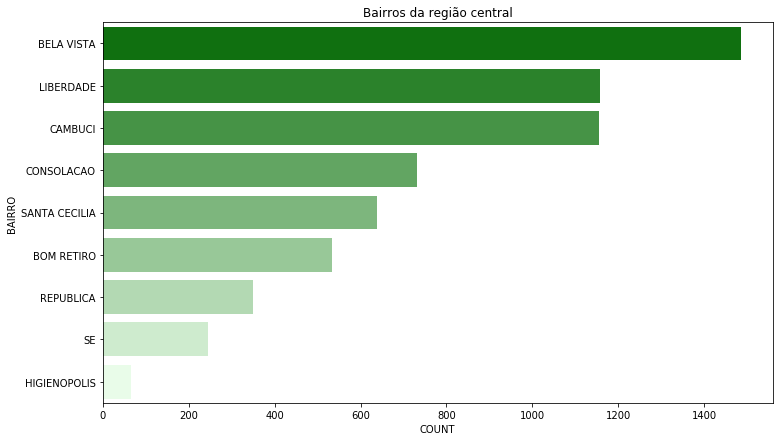

In [97]:
plt.figure(figsize=(12,7))
plt.title("Bairros da região central")
sns.barplot(x="COUNT", y="BAIRRO", data=graf_centro_2.head(20),  palette=sns.light_palette ("green", reverse=True, n_colors=len(graf_centro_2)));

**Na região central da capital temos a bela vista como o bairro com mais ocorrências de furto em contra partida temos higienópolis com baixíssimos números de furtos de automóveis**

In [98]:
centro['REGIAO'] = 'Centro'

In [109]:
zona_norte = capital.loc[capital['BAIRRO'].isin(['ANHANGUERA', 
                                                 'BRASILÂNDIA', 'BRASILANDIA',
                                                 'CASA VERDE', 
                                                 'CACHOEIRINHA', 
                                                 'FREGUESIA DO Ó','FREGUESIA DO O',
                                                 'JAÇANÃ', 'JACANÃ', 'JAÇANA', 'JACANA',
                                                 'JARAGUÁ', 'JARAGUA',
                                                 'LIMÃO', 'LIMAO',
                                                 'MANDAQUI',
                                                 'PERUS',
                                                 'PIRITUBA',
                                                 'SANTANA',
                                                 'SÃO DOMINGOS', 'SAO DOMINGOS',
                                                 'TREMEMBÉ', 'TREMEMBE',
                                                 'TUCURUVI',
                                                 'VILA MARIA', 'V MARIA',
                                                 'VILA MEDEIROS', 'V MEDEIROS',
                                                 'VILA GUILHERME', 'V GUILHERME',
                                                 ])]

In [111]:
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('V ','VILA '))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('SÉ','SE'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('FREGUESIA DO Ó','FREGUESIA DO O'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('SÃO DOMINGOS','SAO DOMINGOS'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('JARAGUÁ','JARAGUA'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('LIMÃO','LIMAO'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('JAÇANÃ','JACANA'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('JAÇANA','JACANA'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('JACANÃ','JACANA'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('BRASILÂNDIA','BRASILANDIA'))
zona_norte['BAIRRO'] = zona_norte['BAIRRO'].apply(lambda x: x.replace('TREMEMBÉ','TREMEMBE'))

In [112]:
zona_norte.BAIRRO.value_counts().head(100)

SANTANA               3844
TUCURUVI              3644
PIRITUBA              3131
VILA MARIA            2928
CASA VERDE            2202
VILA GUILHERME        1953
FREGUESIA DO ODO O    1825
VILA MEDEIROS         1790
MANDAQUI              1514
LIMAO                 1506
SAO DOMINGOS          1446
JARAGUA               1313
JACANA                1275
TREMEMBE               947
CACHOEIRINHA           897
BRASILANDIA            788
PERUS                  630
ANHANGUERA             221
Name: BAIRRO, dtype: int64

In [113]:
graf_zona_norte = zona_norte.groupby('BAIRRO',as_index=False).agg({'COUNT':'sum'})

In [114]:
graf_zona_norte_2 = graf_zona_norte.sort_values(by='COUNT', ascending=False)

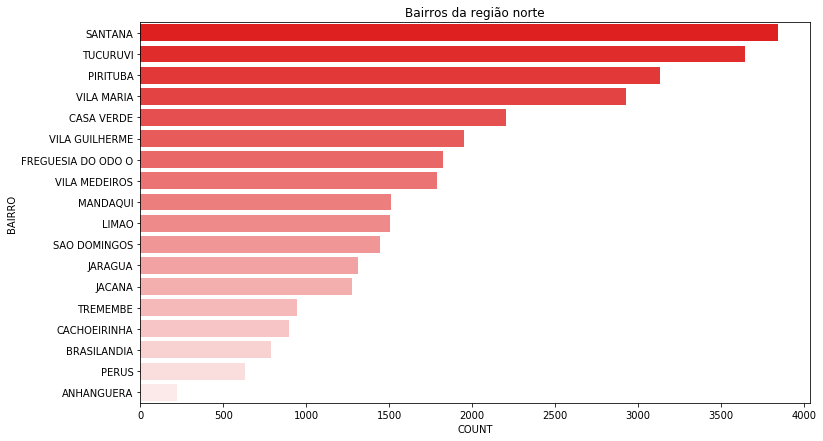

In [115]:
plt.figure(figsize=(12,7))
plt.title("Bairros da região norte")
sns.barplot(x="COUNT", y="BAIRRO", data=graf_zona_norte_2.head(20),  palette=sns.light_palette ("red", reverse=True, n_colors=len(graf_zona_norte_2)));

**Já na Zona norte da capital temos Santana, Tucuruvi e Pirituba como os bairros mais perigosos para se deixar o automóvel estacionado em vía pública, já o bairro da Anhanguera é o que resgistro menos ocorrências de furto na região norte.**

In [116]:
zona_norte['REGIAO'] = 'Zona Norte'

In [117]:
zona_sul = capital.loc[capital['BAIRRO'].isin(['CAMPO BELO', 
                                                'CAMPO LIMPO',
                                                'CAPÃO REDONDO', 'CAPAO REDONDO', 
                                                'CIDADE ADEMAR', 
                                                'CIDADE DUTRA',
                                                'CURSINO',
                                                'GRAJAÚ', 'GRAJAU',
                                                'ITAIM BIBI',
                                                'IPIRANGA',
                                                'JABAQUARA',
                                                'JARDIM ÂNGELA', 'JARDIM ANGELA',
                                                'JARDIM SÃO LUÍS', 'JARDIM SAO LUIS', 'JARDIM SÃO LUIS', 'JARDIM SAO LUÍS',
                                                'MARSILAC',
                                                'MOEMA',
                                                'MORUMBI',
                                                'PARELHEIROS',
                                                'PEDREIRA',
                                                'SACOMÃ', 'SACOMA',
                                                'SANTO AMARO SOCORRO', 'SANTO AMARO', 'SOCORRO',
                                                'SAÚDE', 'SAUDE',
                                                'VILA ANDRADE',
                                                'VILA MARIANA',
                                                'VILA OLIMPIA', 'VILA OLÍMPIA'
                                                 ])]

In [118]:
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('SAÚDE','SAUDE'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('GRAJAÚ','GRAJAU'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('SACOMÃ','SACOMA'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('JARDIM ÂNGELA','JARDIM ANGELA'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('CAPÃO REDONDO','CAPAO REDONDO'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('VILA OLÍMPIA','VILA OLIMPIA'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('JARDIM SÃO LUÍS','JARDIM SAO LUIS'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('JARDIM SÃO LUIS','JARDIM SAO LUIS'))
zona_sul['BAIRRO'] = zona_sul['BAIRRO'].apply(lambda x: x.replace('JARDIM SAO LUÍS','JARDIM SAO LUIS'))

In [119]:
zona_sul.BAIRRO.value_counts().head(100)

IPIRANGA           5952
VILA MARIANA       3950
SANTO AMARO        3334
CIDADE DUTRA       2470
SAUDE              1911
SACOMA             1648
CAMPO LIMPO        1646
GRAJAU             1642
JABAQUARA          1585
CAPAO REDONDO      1440
CIDADE ADEMAR      1263
ITAIM BIBI         1031
SOCORRO             983
MOEMA               924
CAMPO BELO          914
JARDIM ANGELA       882
PEDREIRA            645
MORUMBI             525
PARELHEIROS         477
VILA ANDRADE        409
VILA OLIMPIA        126
JARDIM SAO LUIS      17
CURSINO              10
MARSILAC              3
Name: BAIRRO, dtype: int64

In [120]:
graf_zona_sul = zona_sul.groupby('BAIRRO',as_index=False).agg({'COUNT':'sum'})

In [121]:
graf_zona_sul_2 = graf_zona_sul.sort_values(by='COUNT', ascending=False)

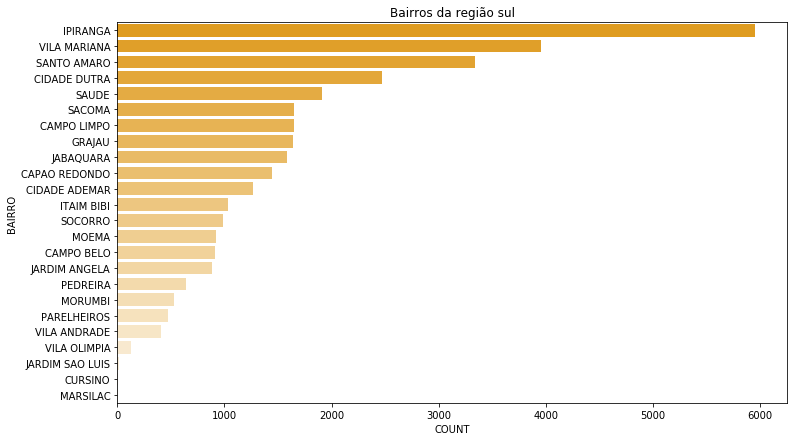

In [122]:
plt.figure(figsize=(12,7))
plt.title("Bairros da região sul")
sns.barplot(x="COUNT", y="BAIRRO", data=graf_zona_sul_2.head(25),  palette=sns.light_palette ("orange", reverse=True, n_colors=len(graf_zona_sul_2)));

**Na Zona sul temos o Ipiranga como o bairro com mais registros de furto de automóvel da região e os bairros da Vila Olímpia, Jardim São Luís, Cursino e Marsilac como os mais seguros para estacionar em vía publica.**

In [123]:
zona_sul['REGIAO'] = 'Zona Sul'

In [124]:
zona_leste = capital.loc[capital['BAIRRO'].isin(['ÁGUA RASA', 'AGUA RASA', 
                                                'ARICANDUVA',
                                                'ARTUR ALVIM', 
                                                'BELÉM', 'BELEM', 
                                                'BRÁS', 'BRAS',
                                                'CANGAÍBA', 'CANGAIBA',
                                                'CARRÃO', 'CARRAO',
                                                'CIDADE LÍDER', 'CIDADE LIDER',
                                                'CIDADE TIRADENTES',
                                                'ERMELINO MATARAZZO',
                                                'GUAIANASES',
                                                'ITAIM PAULISTA',
                                                'ITAQUERA',
                                                'JARDIM HELENA',
                                                'JOSÉ BONIFÁCIO', 'JOSE BONIFÁCIO', 'JOSÉ BONIFACIO', 'JOSE BONIFACIO',
                                                'LAJEADO',
                                                'MOOCA',
                                                'PARI',
                                                'PARQUE DO CARMO',
                                                'PENHA',
                                                'PONTE RASA',
                                                'SÃO LUCAS', 'SAO LUCAS',
                                                'SÃO MATEUS', 'SAO MATEUS',
                                                'SÃO MIGUEL', 'SAO MIGUEL',
                                                'SÃO RAFAEL', 'SAO RAFAEL',
                                                'SAPOPEMBA',
                                                'TATUAPÉ', 'TATUAPE',
                                                'VILA CURUÇA', 'VILA CURUCA', 'V CURUÇA', 'V CURUCA',
                                                'VILA FORMOSA', 'V FORMOSA',
                                                'VILA JACUI', 'VILA JACUÍ', 'VILA JACUÍ', 'V JACUI',
                                                'VILA MATILDE', 'V MATILDE',
                                                'VILA PRUDENTE', 'V PRUDENTE'
                                                 ])]

In [125]:
zona_leste.BAIRRO.value_counts().head(100)

TATUAPE               4701
PENHA                 4650
VILA PRUDENTE         4567
ITAQUERA              4532
SAO MATEUS            4148
MOOCA                 3774
SAPOPEMBA             3444
SAO LUCAS             3132
VILA MATILDE          2828
VILA FORMOSA          2810
AGUA RASA             2788
ARTUR ALVIM           2235
ITAIM PAULISTA        2131
CARRAO                1883
PARQUE DO CARMO       1760
ARICANDUVA            1668
CANGAIBA              1559
ERMELINO MATARAZZO    1508
VILA JACUI            1468
SAO MIGUEL            1405
TATUAPÉ               1360
CIDADE LIDER          1323
GUAIANASES            1288
JOSE BONIFACIO        1197
CIDADE TIRADENTES     1164
BELEM                 1087
VILA CURUCA           1032
SAO RAFAEL             973
PONTE RASA             939
LAJEADO                811
BRAS                   787
PARI                   766
JARDIM HELENA          622
SÃO MATEUS             356
BRÁS                   109
VILA JACUÍ              85
CIDADE LÍDER            57
V

In [126]:
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('SÃO MATEUS','SAO MATEUS'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('TATUAPÉ','TATUAPE'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('SÃO LUCAS','SAO LUCAS'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('ÁGUA RASA','AGUA RASA'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('CARRÃO','CARRAO'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('VILA JACUÍ','VILA JACUI'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('V JACUI','VILA JACUI'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('SÃO MIGUEL','SAO MIGUEL'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('CANGAÍBA','CANGAIBA'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('CIDADE LÍDER','CIDADE LIDER'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('JOSE BONIFÁCIO','JOSE BONIFACIO'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('JOSÉ BONIFACIO','JOSE BONIFACIO'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('JOSÉ BONIFÁCIO','JOSE BONIFACIO'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('BELÉM','BELEM'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('SÃO RAFAEL','SAO RAFAEL'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('VILA CURUÇA','VILA CURUCA'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('BRÁS','BRAS'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('V PRUDENTE','VILA PRUDENTE'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('V MATILDE','VILA MATILDE'))
zona_leste['BAIRRO'] = zona_leste['BAIRRO'].apply(lambda x: x.replace('V FORMOSA','VILA FORMOSA'))

In [127]:
zona_leste.BAIRRO.value_counts().head(100)

TATUAPE               6061
PENHA                 4650
VILA PRUDENTE         4594
ITAQUERA              4532
SAO MATEUS            4504
MOOCA                 3774
SAPOPEMBA             3444
SAO LUCAS             3146
VILA MATILDE          2861
AGUA RASA             2842
VILA FORMOSA          2823
ARTUR ALVIM           2235
ITAIM PAULISTA        2131
CARRAO                1905
PARQUE DO CARMO       1760
ARICANDUVA            1668
CANGAIBA              1603
VILA JACUI            1559
ERMELINO MATARAZZO    1508
SAO MIGUEL            1448
CIDADE LIDER          1380
GUAIANASES            1288
JOSE BONIFACIO        1207
CIDADE TIRADENTES     1164
BELEM                 1130
VILA CURUCA           1088
SAO RAFAEL             984
PONTE RASA             939
BRAS                   896
LAJEADO                811
PARI                   766
JARDIM HELENA          622
Name: BAIRRO, dtype: int64

In [128]:
graf_zona_leste = zona_leste.groupby('BAIRRO',as_index=False).agg({'COUNT':'sum'})

In [129]:
graf_zona_leste_2 = graf_zona_leste.sort_values(by='COUNT', ascending=False)

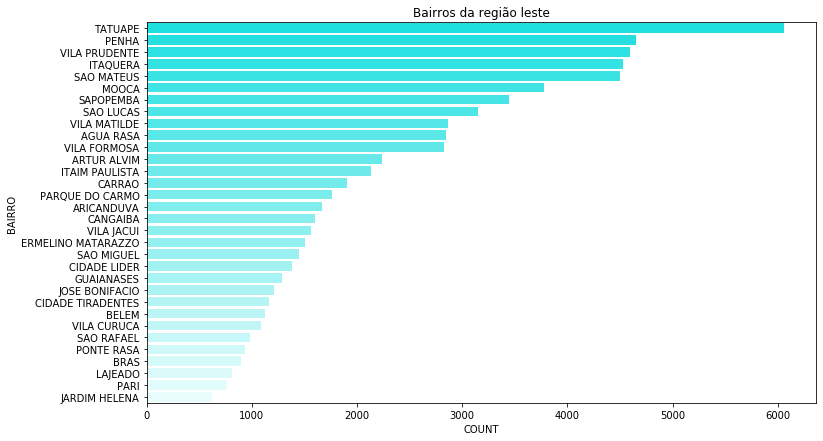

In [130]:
plt.figure(figsize=(12,7))
plt.title("Bairros da região leste")
sns.barplot(x="COUNT", y="BAIRRO", data=graf_zona_leste_2.head(35),  palette=sns.light_palette ("cyan", reverse=True, n_colors=len(graf_zona_leste_2)));